<a href="https://colab.research.google.com/github/stellarsb7/GFS-Net/blob/main/Source%20Code/HistopathologicOralCancerIdentificationModelNotebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install kaggle

# from google.colab import drive
# drive.mount('/content/drive')

! mkdir ~/.kaggle

# !cp /content/drive/MyDrive/ColabNotebooks/Kaggle_API/kaggle.json ~/.kaggle/kaggle.json
# !cp /content/drive/MyDrive/Colab_Notebooks/Kaggle_JSON/kaggle.json ~/.kaggle/kaggle.json



In [ ]:
# ! unzip /content/oral-cancer-dataset2-split-and-augmented.zip
# ! unzip /content/drive/MyDrive/KaggleData/histo_oral_cancer_full.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/Normal/Normal_100x_85.jpg  
  inflating: train/Normal/Normal_100x_86.jpg  
  inflating: train/Normal/Normal_100x_87.jpg  
  inflating: train/Normal/Normal_100x_89.jpg  
  inflating: train/Normal/Normal_100x_9.jpg  
  inflating: train/Normal/Normal_400x_1.jpg  
  inflating: train/Normal/Normal_400x_100.jpg  
  inflating: train/Normal/Normal_400x_101.jpg  
  inflating: train/Normal/Normal_400x_102.jpg  
  inflating: train/Normal/Normal_400x_103.jpg  
  inflating: train/Normal/Normal_400x_107.jpg  
  inflating: train/Normal/Normal_400x_108.jpg  
  inflating: train/Normal/Normal_400x_109.jpg  
  inflating: train/Normal/Normal_400x_11.jpg  
  inflating: train/Normal/Normal_400x_110.jpg  
  inflating: train/Normal/Normal_400x_111.jpg  
  inflating: train/Normal/Normal_400x_112.jpg  
  inflating: train/Normal/Normal_400x_113.jpg  
  inflating: train/Normal/Normal_400x_114.jpg  
  inflating: train/Normal/Normal_400x_115.jpg 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! unzip /content/drive/MyDrive/KaggleData/oralCancer2AugmentedSplit.zip

Archive:  /content/drive/MyDrive/KaggleData/oralCancer2AugmentedSplit.zip
  inflating: Oral_Cancer_Split/Test/cancer/01960a64-cfe8-444d-bbc5-575c15389a21.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/324950_1100.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/Lower_lip_cancer.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/Oral-cancer-Courtesy-of-Professor-Jan-Zapa1a-Chair-of-Cranio-Maxillofacial.png  
  inflating: Oral_Cancer_Split/Test/cancer/a342a6a0-d3f6-4459-b99a-6a4d4313aa9f.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/b2585c8d-65a0-4476-a4e6-a9f2d424cd60.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/base-of-tongue-cancer-symptoms.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/dataset_1200px-ZungenCa2a.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/dataset_3-s2.0-B9780443100734500148-f10-07-9780443100734.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/dataset_base-of-tongue-cancer-symptoms.jpg  
  inflating: Oral_Cancer_Split/Test/cancer/dataset_left_lateral_tong

In [ ]:
! cp /content/kaggle.json  ~/.kaggle/kaggle.json

cp: cannot stat '/content/kaggle.json': No such file or directory


In [ ]:
! chmod 600   ~/.kaggle/kaggle.json

# ! kaggle datasets download -d sumanghosh1/oral-cancer-dataset2-split-and-augmented
! kaggle datasets download -d ashenafifasilkebede/histopathologic-oral-cancer-detection-using-cnns

403 - Forbidden - Permission 'datasets.get' was denied


In [ ]:
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import tensorflow as tf
from keras.metrics import Accuracy
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from tensorflow import keras
from tensorflow.keras.utils import plot_model
#from keras import backend as K

import os
import cv2
from PIL import Image
import numpy as np
from keras.utils import to_categorical

!pip install Py_FS
!pip install ReliefF
from  Py_FS.evaluation.evaluate import evaluate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ReliefF: filename=ReliefF-0.1.2-py3-none-any.whl size=6303 sha256=ea4e938f0e21530e2274305a9a67d35ef65d9f25f4319ade381359bc68f36721
  Stored in directory: /root/.cache/pip/wheels/35/bc/0b/14a0227d4829b6b27f25de250213eb348b094d075be7604707
Successfully built ReliefF


In [ ]:
# @title Training Dataset
image_directory ="/content/Oral_Cancer_Split/Train_aug/"
SIZE = 224
X_train = []
y_train = []

X_val=[]
y_val=[]

cancerous = os.listdir(os.path.join(image_directory,'cancer'))
print(cancerous)
for i, image_name in enumerate(cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

    if (image_name.split('.')[1] == 'jpg'):
        path=os.path.join(image_directory,'cancer',image_name)
        # print(path)
        image = cv2.imread(path)
        image = Image.fromarray(image, 'RGB')
        image = image.resize((SIZE, SIZE))
        if i<2130:
          X_train.append(np.array(image))
          y_train.append(1)
        else:
          X_val.append(np.array(image))
          y_val.append(1)

non_cancerous = os.listdir(os.path.join(image_directory,'non-cancer'))
for i, image_name in enumerate(non_cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

    if (image_name.split('.')[1] == 'jpg'):
        image = cv2.imread(os.path.join(image_directory,'non-cancer',image_name))
        image = Image.fromarray(image, 'RGB')
        image = image.resize((SIZE, SIZE))
        if i<2130:
          X_train.append(np.array(image))
          y_train.append(0)
        else:
          X_val.append(np.array(image))
          y_val.append(0)


# image_directory = '/content/val/'
# SIZE = 224

# cancerous = os.listdir(image_directory + 'OSCC/')
# for i, image_name in enumerate(cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         image = cv2.imread(image_directory + 'OSCC/' + image_name)
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_train.append(np.array(image))
#         y_train.append(1)

# non_cancerous = os.listdir(image_directory + 'Normal/')
# for i, image_name in enumerate(non_cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         image = cv2.imread(image_directory + 'Normal/' + image_name)
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_train.append(np.array(image))
#         y_train.append(0)

print(len(X_train))
print(len(y_train))

print(len(X_val))
print(len(y_val))

['aug_0_5884.jpg', 'aug_0_1351.jpg', 'aug_0_4961.jpg', 'aug_0_1985.jpg', 'aug_0_7651.jpg', 'aug_0_1341.jpg', 'aug_0_4954.jpg', 'aug_0_8728.jpg', 'aug_0_2352.jpg', 'aug_0_854.jpg', 'aug_0_2947.jpg', 'aug_0_9810.jpg', 'aug_0_8751.jpg', 'aug_0_2692.jpg', 'aug_0_2039.jpg', 'aug_0_4528.jpg', 'aug_0_2743.jpg', 'aug_0_3069.jpg', 'aug_0_4339.jpg', 'aug_0_1384.jpg', 'aug_0_2669.jpg', 'aug_0_6536.jpg', 'aug_0_8145.jpg', 'aug_0_7109.jpg', 'aug_0_5634.jpg', 'aug_0_8002.jpg', 'aug_0_3044.jpg', 'aug_0_3545.jpg', 'aug_0_2799.jpg', 'aug_0_720.jpg', 'aug_0_9213.jpg', 'aug_0_7737.jpg', 'aug_0_7239.jpg', 'aug_0_6657.jpg', 'aug_0_479.jpg', 'aug_0_6770.jpg', 'aug_0_2156.jpg', 'aug_0_4313.jpg', 'aug_0_7886.jpg', 'aug_0_3672.jpg', 'aug_0_1470.jpg', 'aug_0_6485.jpg', 'aug_0_4949.jpg', 'aug_0_4380.jpg', 'aug_0_562.jpg', 'aug_0_6678.jpg', 'aug_0_129.jpg', 'aug_0_2978.jpg', 'aug_0_3870.jpg', 'aug_0_902.jpg', 'aug_0_8453.jpg', 'aug_0_9728.jpg', 'aug_0_8814.jpg', 'aug_0_1199.jpg', 'aug_0_5839.jpg', 'aug_0_3512.jpg

In [ ]:
image_directory ="/content/Oral_Cancer_Split/Test/"
SIZE = 224
X_test = []
y_test = []

cancerous = os.listdir(os.path.join(image_directory,'cancer'))
print(cancerous)
for i, image_name in enumerate(cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

    # if (image_name.split('.')[1] == 'jpg' or image_name.split('.')[1] == 'png' or image_name.split('.')[1] == 'jpeg'):
    path=os.path.join(image_directory,'cancer',image_name)
    # print(path)
    image = cv2.imread(path)
    image = Image.fromarray(image, 'RGB')
    image = image.resize((SIZE, SIZE))
    X_test.append(np.array(image))
    y_test.append(1)

non_cancerous = os.listdir(os.path.join(image_directory,'non-cancer'))
for i, image_name in enumerate(non_cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

    # if (image_name.split('.')[1] == 'jpg' or image_name.split('.')[1] == 'png' or image_name.split('.')[1] == 'jpeg'):
    image = cv2.imread(os.path.join(image_directory,'non-cancer',image_name))
    image = Image.fromarray(image, 'RGB')
    image = image.resize((SIZE, SIZE))
    X_test.append(np.array(image))
    y_test.append(0)

print(len(X_test))
print(len(y_test))

['dataset_3-s2.0-B9780443100734500148-f10-07-9780443100734.jpg', 'b2585c8d-65a0-4476-a4e6-a9f2d424cd60.jpg', 'dataset_1200px-ZungenCa2a.jpg', 'images (2).jpeg', 'lipreconstruction1.jpg', '01960a64-cfe8-444d-bbc5-575c15389a21.jpg', 'Oral-cancer-Courtesy-of-Professor-Jan-Zapa1a-Chair-of-Cranio-Maxillofacial.png', 'dataset_left_lateral_tongue_dysplasia_3.jpeg', 'pract_oral_cancer.jpg', 'a342a6a0-d3f6-4459-b99a-6a4d4313aa9f.jpg', 'skin-cancer-on-lips-treatment.jpg', 'mouth-cancer-symptoms-1.jpg', 'oralcancer1.png', 'dataset_mouth-photo-4.png', 'lip-reconstruction-gallery-skin-cancer-and-reconstructive-surgery-pertaining-to-lip-cancer-surgery.jpg', 'images (4).jpeg', 'Lower_lip_cancer.jpg', 'oral-cancer-treatment-500x500.png', '324950_1100.jpg', 'base-of-tongue-cancer-symptoms.jpg', 'dataset_base-of-tongue-cancer-symptoms.jpg', 'squamous-cell-carinoma-of-the-tongue.jpg']
33
33


In [ ]:
# #@title Training Dataset
# image_directory ="/content/train/"
# SIZE = 224
# X_train = []
# y_train = []

# cancerous = os.listdir(os.path.join(image_directory,'OSCC'))
# for i, image_name in enumerate(cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         path=os.path.join(image_directory,'OSCC',image_name)
#         # print(path)
#         image = cv2.imread(path)
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_train.append(np.array(image))
#         y_train.append(1)

# non_cancerous = os.listdir(os.path.join(image_directory,'Normal'))
# for i, image_name in enumerate(non_cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         image = cv2.imread(os.path.join(image_directory,'Normal',image_name))
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_train.append(np.array(image))
#         y_train.append(0)


# image_directory = '/content/val/'
# SIZE = 224

# cancerous = os.listdir(os.path.join(image_directory,'OSCC'))
# for i, image_name in enumerate(cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         image = cv2.imread(image_directory + 'OSCC/' + image_name)
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_train.append(np.array(image))
#         y_train.append(1)

# non_cancerous = os.listdir(os.path.join(image_directory,'Normal'))
# # non_cancerous = os.listdir(image_directory + 'Normal/')
# for i, image_name in enumerate(non_cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         image = cv2.imread(image_directory + 'Normal/' + image_name)
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_train.append(np.array(image))
#         y_train.append(0)

# print(len(X_train))
# print(len(y_train))

5066
5066


In [ ]:
# #@title Test Dataset
# image_directory = '/content/test/'
# SIZE = 224
# X_test = []
# y_test = []

# cancerous = os.listdir(image_directory + 'OSCC/')
# for i, image_name in enumerate(cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         image = cv2.imread(image_directory + 'OSCC/' + image_name)
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_test.append(np.array(image))
#         y_test.append(1)

# non_cancerous = os.listdir(image_directory + 'Normal/')
# for i, image_name in enumerate(non_cancerous):    #Remember enumerate method adds a counter and returns the enumerate object

#     if (image_name.split('.')[1] == 'jpg'):
#         image = cv2.imread(image_directory + 'Normal/' + image_name)
#         image = Image.fromarray(image, 'RGB')
#         image = image.resize((SIZE, SIZE))
#         X_test.append(np.array(image))
#         y_test.append(0)

# print(len(X_test))
# print(len(y_test))

126
126


In [ ]:
X_val=[]
y_val=[]

X_train2=[]
y_train2=[]

for i in range(len(X_train)):
  if i<240:
    X_val.append(X_train[i])
    y_val.append(y_train[i])
  else:
    X_train2.append(X_train[i])
    y_train2.append(X_train[i])

print(len(X_train2))
print(len(X_val))

4288
240


In [ ]:
# final_model = tf.keras.models.load_model('/content/drive/MyDrive/ColabNotebooks/Oral Cancer models/Copy of Copy of bm_nasnet_9286.h5')
final_model = tf.keras.models.load_model('/content/drive/MyDrive/Models/Oral-Cancer-Detection/Macro-Dataset2SplitAug/NoSqueeze.h5')
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 stem_conv1 (Conv2D)         (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 stem_bn1 (BatchNormalizati  (None, 111, 111, 32)         128       ['stem_conv1[0][0]']          
 on)                                                                                              
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['stem_bn1[0][0]']        

In [ ]:
INPUT_SHAPE = (224, 224, 3)
model = tf.keras.applications.NASNetMobile(input_shape = INPUT_SHAPE, include_top=True, weights='imagenet')
model.summary()

NameError: name 'tf' is not defined

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Reshape, Multiply

def squeeze_excite_block(input_tensor, ratio=16):
    # Get the number of channels in the input tensor
    channels = input_tensor.shape[-1]

    # Squeeze: Global average pooling across the spatial dimensions
    squeeze = GlobalAveragePooling2D()(input_tensor)  # Reduce to 1x1 spatial dimensions
    squeeze = Reshape((1, 1, channels))(squeeze)     # Reshape to 1x1xC

    # Excitation: Two fully connected (dense) layers with ReLU activation
    excitation = Dense(channels // ratio, activation='relu')(squeeze)
    excitation = Dense(channels, activation='sigmoid')(excitation)

    # Reshape the excitation output to match the shape of the input tensor
    excitation = Reshape((1, 1, channels))(excitation)

    # Multiply the input tensor by the excitation output
    scaled_input = Multiply()([input_tensor, excitation])

    return scaled_input

In [ ]:
out=model.get_layer('activation_187').output
# out=squeeze_excite_block(out)

In [ ]:
out=model.get_layer('activation_187').output
out=squeeze_excite_block(out)

In [ ]:
output=GlobalAveragePooling2D()(out)
output=Dense(512,activation='relu')(output)
output=Dense(64,activation='relu')(output)
output=Dense(2,activation='sigmoid')(output)

In [ ]:
final_model=Model(inputs=model.input,outputs=output)

In [ ]:
final_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 stem_conv1 (Conv2D)         (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 stem_bn1 (BatchNormalizati  (None, 111, 111, 32)         128       ['stem_conv1[0][0]']          
 on)                                                                                              
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['stem_bn1[0][0]']      

In [ ]:
plot_model(final_model, show_shapes = True, show_layer_names = True)

In [ ]:
METRICS = ['accuracy',
           tf.keras.metrics.Precision(),
           tf.keras.metrics.Recall(),
           tf.keras.metrics.F1Score()
           ]
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Models/Oral-Cancer-Detection/Macro-Dataset2SplitAug/Squeeze.h5',
                             monitor='val_accuracy',
                             save_best_only=True,
                             verbose=1)
# final_model.compile(
#     optimizer='adam',
#     loss='categorical_crossentropy',
#     metrics=METRICS
# )
lr_schedule = tf.keras.callbacks.ReduceLROnPlateau(factor=0.001, patience=5, min_lr=1e-6)
history = final_model.fit(np.array(X_train),
              to_categorical(np.array(y_train)),
              batch_size = 8,
              validation_data = (np.array(X_val), to_categorical(np.array(y_val))),
              epochs = 20,
              callbacks=[checkpoint,lr_schedule]
              )

Epoch 1/20
533/533 [==============================] - ETA: 0s - loss: 0.0142 - accuracy: 0.9932 - precision_1: 0.9930 - recall_1: 0.9944 - f1_score: 0.9932
Epoch 1: val_accuracy improved from -inf to 0.98507, saving model to /content/drive/MyDrive/Models/Oral-Cancer-Detection/Macro-Dataset2SplitAug/Squeeze.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


533/533 [==============================] - 214s 173ms/step - loss: 0.0142 - accuracy: 0.9932 - precision_1: 0.9930 - recall_1: 0.9944 - f1_score: 0.9932 - val_loss: 0.0308 - val_accuracy: 0.9851 - val_precision_1: 0.9814 - val_recall_1: 0.9851 - val_f1_score: 0.9850 - lr: 1.0000e-06
Epoch 2/20
533/533 [==============================] - ETA: 0s - loss: 0.0160 - accuracy: 0.9939 - precision_1: 0.9937 - recall_1: 0.9941 - f1_score: 0.9939
Epoch 2: val_accuracy did not improve from 0.98507
533/533 [==============================] - 76s 142ms/step - loss: 0.0160 - accuracy: 0.9939 - precision_1: 0.9937 - recall_1: 0.9941 - f1_score: 0.9939 - val_loss: 0.0303 - val_accuracy: 0.9813 - val_precision_1: 0.9814 - val_recall_1: 0.9851 - val_f1_score: 0.9813 - lr: 1.0000e-06
Epoch 3/20
533/533 [==============================] - ETA: 0s - loss: 0.0146 - accuracy: 0.9946 - precision_1: 0.9939 - recall_1: 0.9948 - f1_score: 0.9946
Epoch 3: val_accuracy did not improve from 0.98507
533/533 [==========

In [ ]:
final_model.evaluate(np.array(X_test), to_categorical(y_test))

2/2 [==============================] - 8s 56ms/step - loss: 0.4774 - accuracy: 0.9091 - precision: 0.9091 - recall: 0.9091 - f1_score: 0.8952


[0.47741368412971497,
 0.9090909361839294,
 0.9090909361839294,
 0.9090909361839294,
 array([0.8571428, 0.9333333], dtype=float32)]

In [ ]:
lab = np.array(y_train)
print(lab.shape)

(4260,)


In [ ]:
lab = lab.reshape(lab.shape[0], 1)
print(lab.shape)

(4260, 1)


In [ ]:
predictions = final_model.get_layer('global_average_pooling2d_1').output
model_feat = keras.Model(inputs = final_model.inputs ,outputs = predictions)
features = model_feat.predict(np.array(X_train))
print(features.shape)

134/134 [==============================] - 13s 49ms/step
(4260, 1056)


In [ ]:
train_X = model_feat.predict(np.array(X_train))
train_Y = np.array(y_train)
test_X = model_feat.predict(np.array(X_test))
test_Y = np.array(y_test)

2/2 [==============================] - 0s 37ms/step


In [ ]:
from Py_FS.wrapper.population_based.GSA import GSA as FS
from  Py_FS.evaluation.evaluate import evaluate


************    Please enter the values of the following paramters or press newline for using default values    ************

Shape of Transfer Function [s/v/u] (default=s):
Percentage of data for valdiation [0-100] (default=30): 
Weight for the classification accuracy [0-1] (default=0.9): 

*****************************************************    Thank You    ******************************************************


                          Iteration - 1


Number of agents: 30

------------- Best Agent ---------------
Fitness: 0.9488876440460947
Number of Features: 510
----------------------------------------

Particle 1 - Fitness: 0.9488876440460947, Number of Features: 510
Particle 2 - Fitness: 0.9486569035424669, Number of Features: 505
Particle 3 - Fitness: 0.9482367690994452, Number of Features: 502
Particle 4 - Fitness: 0.9481834186939821, Number of Features: 510
Particle 5 - Fitness: 0.9478579812206573, Number of Features: 506
Particle 6 - Fitness: 0.9477099338454973, Number o

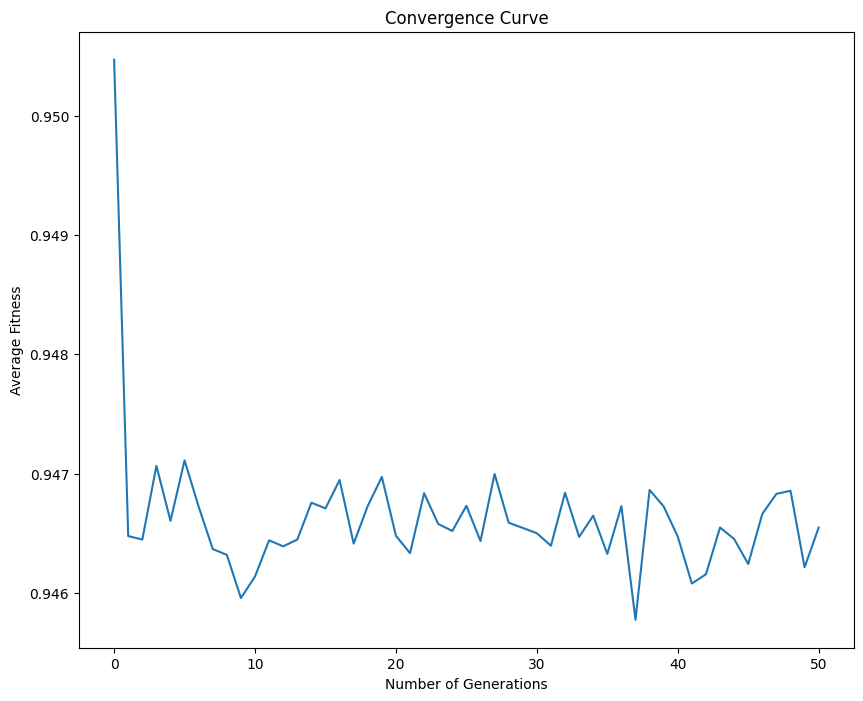


------------- Leader Agent ---------------
Fitness: 0.964524647887324
Number of Features: 542
----------------------------------------



In [ ]:
# data = datasets.load_digits()
algo = FS(num_agents=30, max_iter=50, train_data=features, train_label=lab, save_conv_graph=True)
results = algo.run()

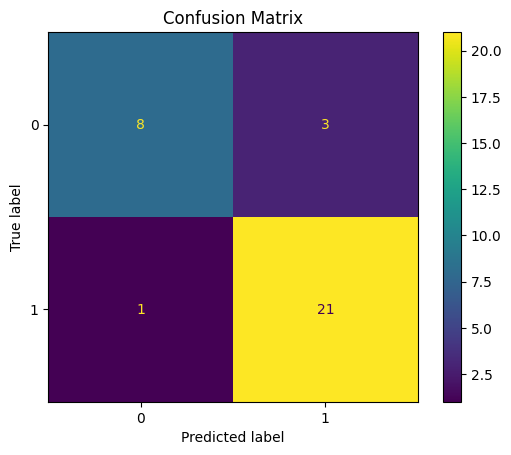

In [ ]:
if(len(np.unique(test_Y))) == 2:
  # if it is binary classification, you will get a precision, recall and f1_score for each of the labels
  result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True)
else:
  # for a multi-class problem, you will get a avreaged precision, recall and f1_score
  # Options for averaging:
  # 1. macro
  # 2. weighted
  # 3. samples
  eval_result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True, averaging="weighted")

In [ ]:
result.predictions

array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0])

In [ ]:
result.accuracy

0.8787878787878788

In [ ]:
result.recall

{0: 0.7272727272727273, 1: 0.9545454545454546}

In [ ]:
result.precision

{0: 0.8888888888888888, 1: 0.875}

In [ ]:
result.f1_score

{0: 0.7999999999999999, 1: 0.9130434782608695}

In [ ]:
result

In [ ]:
from Py_FS.wrapper.population_based.CS import CS as FS
from  Py_FS.evaluation.evaluate import evaluate


************    Please enter the values of the following paramters or press newline for using default values    ************

Shape of Transfer Function [s/v/u] (default=s): 
Fraction of nests to be replaced [0-1] (default=0.25): 
Percentage of data for valdiation [0-100] (default=30): 
Weight for the classification accuracy [0-1] (default=0.9): 

*****************************************************    Thank You    ******************************************************


                          Iteration - 1


Number of agents: 30

------------- Best Agent ---------------
Fitness: 0.964524647887324
Number of Features: 330
----------------------------------------

Cuckoo 1 - Fitness: 0.964524647887324, Number of Features: 330
Cuckoo 2 - Fitness: 0.9628614489970124, Number of Features: 355
Cuckoo 3 - Fitness: 0.9601565834400342, Number of Features: 391
Cuckoo 4 - Fitness: 0.9600205399061033, Number of Features: 385
Cuckoo 5 - Fitness: 0.9593576611182245, Number of Features: 392
Cucko

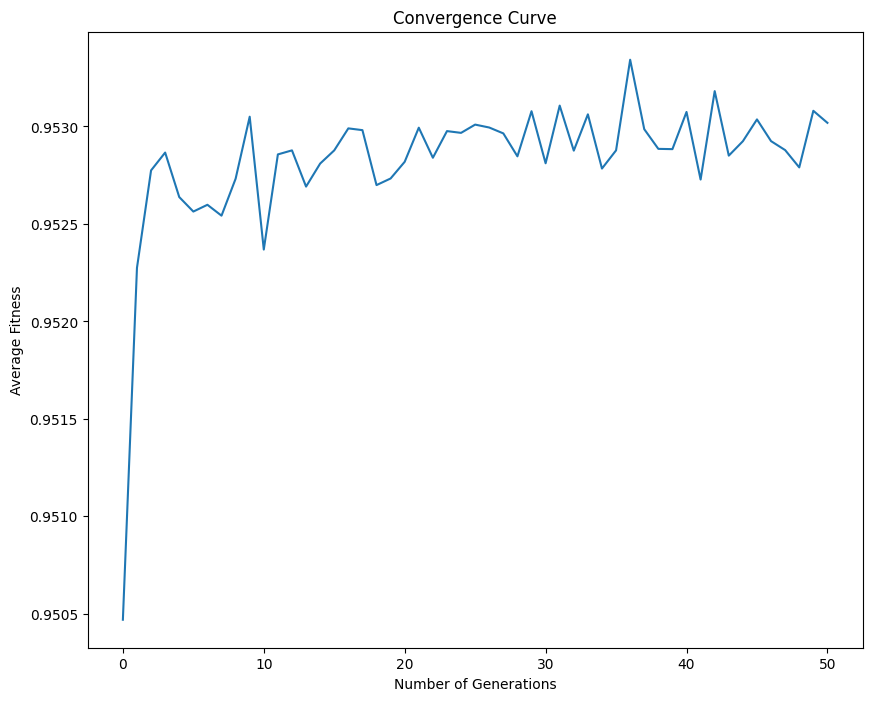


------------- Leader Agent ---------------
Fitness: 0.964524647887324
Number of Features: 330
----------------------------------------



In [ ]:
algo = FS(num_agents=30, max_iter=50, train_data=features, train_label=lab, save_conv_graph=True)
results = algo.run()

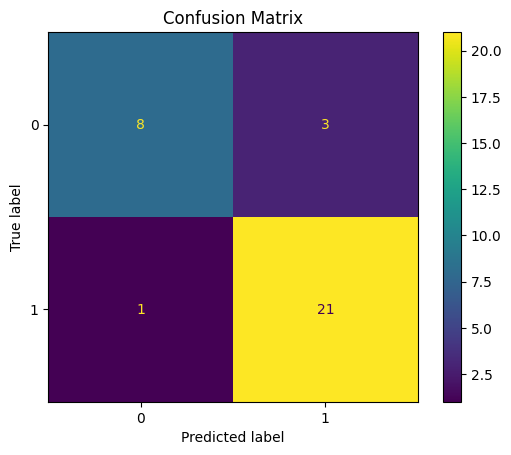

In [ ]:
if(len(np.unique(test_Y))) == 2:
  # if it is binary classification, you will get a precision, recall and f1_score for each of the labels
  result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True)
else:
  # for a multi-class problem, you will get a avreaged precision, recall and f1_score
  # Options for averaging:
  # 1. macro
  # 2. weighted
  # 3. samples
  eval_result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True, averaging="weighted")

In [ ]:
result.predictions

array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0])

In [ ]:
result.accuracy

0.8787878787878788

In [ ]:
result.precision

{0: 0.8888888888888888, 1: 0.875}

In [ ]:
result.recall

{0: 0.7272727272727273, 1: 0.9545454545454546}

In [ ]:
result.f1_score

{0: 0.7999999999999999, 1: 0.9130434782608695}

In [ ]:
np.savetxt("ext_features4.csv", features, delimiter=",")

In [ ]:
lab = np.array(y_train)
print(lab.shape)

(4260,)


In [ ]:
lab = lab.reshape(lab.shape[0], 1)
print(lab.shape)

(4260, 1)


In [ ]:
np.savetxt('labels4.csv', lab, delimiter= ',')

In [ ]:
val_X = model_feat.predict(np.array(X_val))
val_Y = np.array(y_val)

9/9 [==============================] - 1s 159ms/step


In [ ]:
train_X = model_feat.predict(np.array(X_train))
train_Y = np.array(y_train)
test_X = model_feat.predict(np.array(X_test))
test_Y = np.array(y_test)

2/2 [==============================] - 0s 24ms/step


In [ ]:
train_X=np.concatenate((train_X,val_X),axis=0)
train_Y=np.concatenate((train_Y,val_Y),axis=0)

In [ ]:
train_Y.shape

(4528,)

**BBA**


************    Please enter the values of the following paramters or press newline for using default values    ************


*****************************************************    Thank You    ******************************************************


                          Iteration - 1


Number of agents: 30

------------- Best Agent ---------------
Fitness: 0.9533562599681021
Number of Features: 355
----------------------------------------

Bat 1 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 2 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 3 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 4 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 5 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 6 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 7 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 8 - Fitness: 0.9533562599681021, Number of Features: 355
Bat 9 - Fitness: 0.9533562599681021, Number of Features: 3

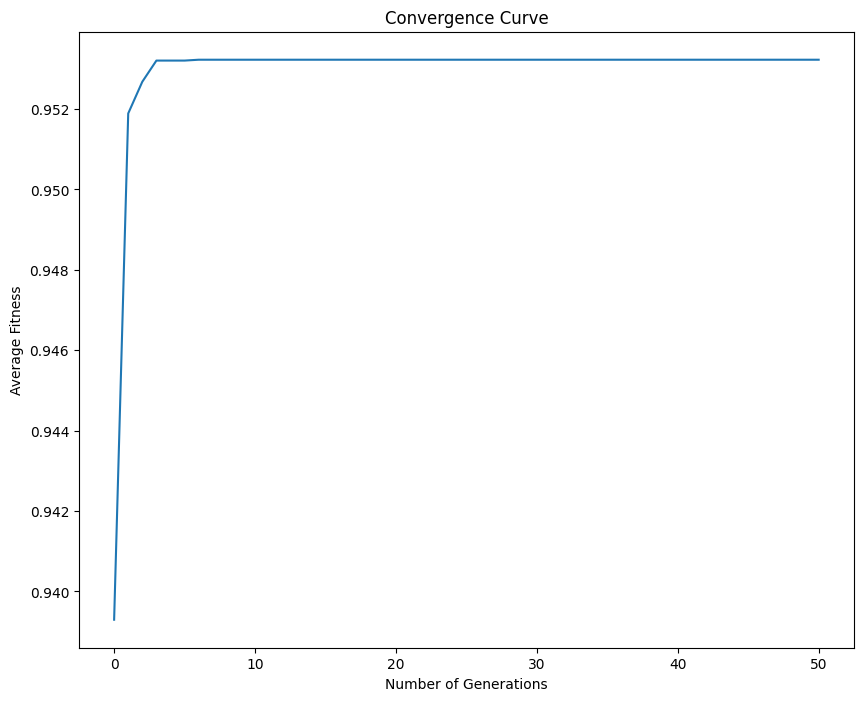


------------- Leader Agent ---------------
Fitness: 0.9534041068580541
Number of Features: 367
----------------------------------------



In [ ]:
from Py_FS.wrapper.population_based.BBA import BBA as FS
from  Py_FS.evaluation.evaluate import evaluate
algo = FS(num_agents=30, max_iter=50, train_data=features, train_label=lab, save_conv_graph=True)
results = algo.run()

In [ ]:
results.solution.best_agent

array([0., 0., 0., ..., 0., 0., 0.])

In [ ]:
results.solution.best_fitness

0.9534041068580541

In [ ]:
results.solution.best_accuracy

0.9855263157894737

In [ ]:
results.solution.final_population

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

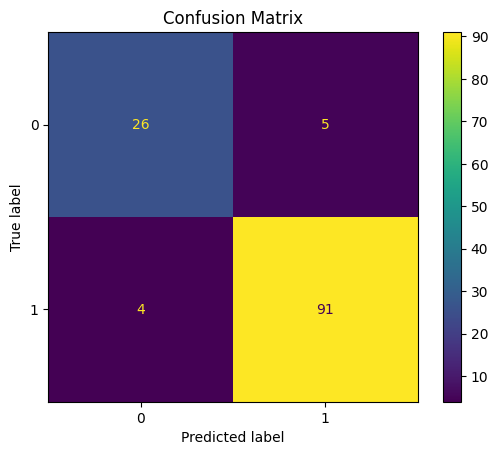

In [ ]:
if(len(np.unique(test_Y))) == 2:
  # if it is binary classification, you will get a precision, recall and f1_score for each of the labels
  result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True)
else:
  # for a multi-class problem, you will get a avreaged precision, recall and f1_score
  # Options for averaging:
  # 1. macro
  # 2. weighted
  # 3. samples
  eval_result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True, averaging="weighted")

In [ ]:
result.predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0])

In [ ]:
result.accuracy

0.9285714285714286

In [ ]:
result.recall

{0: 0.8387096774193549, 1: 0.9578947368421052}

In [ ]:
result.precision

{0: 0.8666666666666667, 1: 0.9479166666666666}

In [ ]:
result.f1_score

{0: 0.8524590163934426, 1: 0.9528795811518324}

**BBA Improvised**


************    Please enter the values of the following paramters or press newline for using default values    ************

Min Frequency (default=0): 
Max Frequency (default=2): 
Loudness (default=1.0): 
Pulse emission rate (default=0.15): 
Alpha value [0-1] (default=0.95): 
Gamma value [0-1] (default=0.5): 
Constant Loudness (True/False) (default=True): 
Shape of Transfer Function [s/v/u] (default=s): 
Percentage of data for valdiation [0-100] (default=30): 
Weight for the classification accuracy [0-1] (default=0.9): 

*****************************************************    Thank You    ******************************************************


                          Iteration - 1


Number of agents: 30

------------- Best Agent ---------------
Fitness: 0.8080065974312663
Number of Features: 391
----------------------------------------

Bat 1 - Fitness: 0.8080065974312663, Number of Features: 391
Bat 2 - Fitness: 0.8080065974312663, Number of Features: 391
Bat 3 - Fitness: 0.808

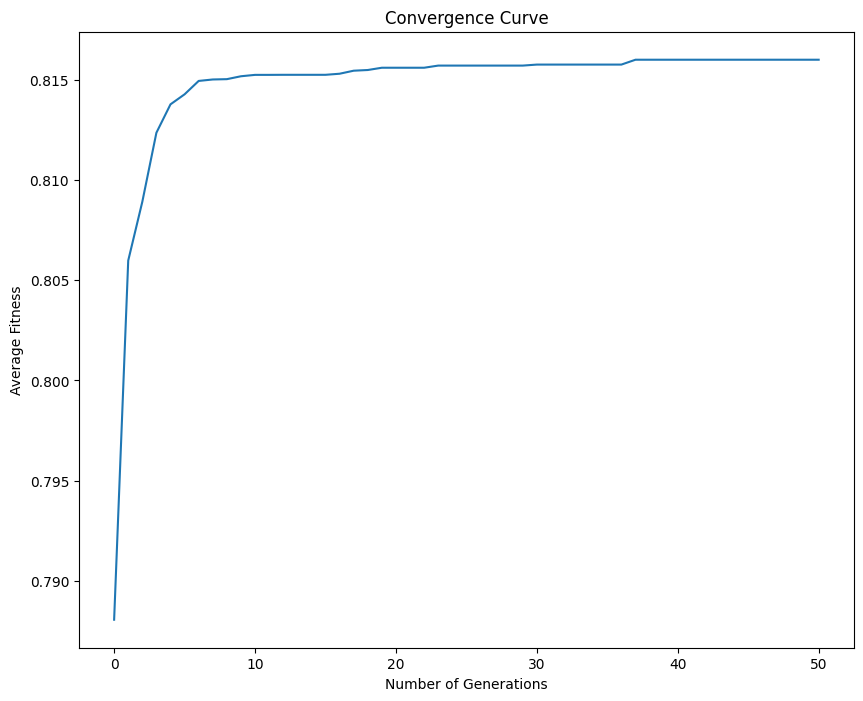


------------- Leader Agent ---------------
Fitness: 0.8225755067228576
Number of Features: 398
----------------------------------------



In [ ]:
from Py_FS.wrapper.population_based.BBA import BBA as FS
algo = FS(num_agents=30, max_iter=50, train_data=features, train_label=lab, save_conv_graph=True)
results = algo.run()

In [ ]:
results.solution.best_agent

array([0., 0., 0., ..., 0., 0., 1.])

In [ ]:
results.solution.best_fitness

0.8225755067228576

In [ ]:
results.solution.best_accuracy

0.8278145695364238

In [ ]:
results.solution.final_population

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 1., 0., 1.],
       ...,
       [1., 0., 1., ..., 0., 0., 1.],
       [0., 0., 1., ..., 0., 0., 1.],
       [0., 0., 1., ..., 0., 0., 1.]])

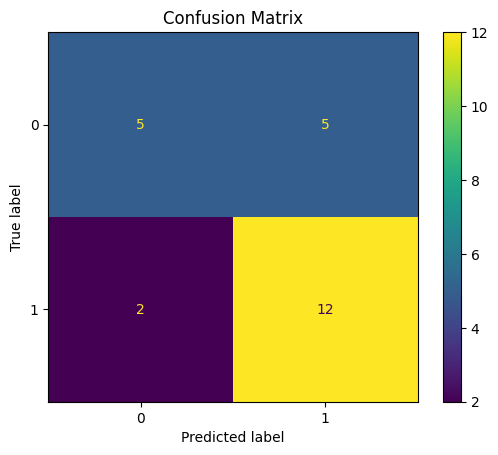

In [ ]:
if(len(np.unique(test_Y))) == 2:
  # if it is binary classification, you will get a precision, recall and f1_score for each of the labels
  result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True)
else:
  # for a multi-class problem, you will get a avreaged precision, recall and f1_score
  # Options for averaging:
  # 1. macro
  # 2. weighted
  # 3. samples
  eval_result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True, averaging="weighted")

In [ ]:
result.predictions

array([0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0,
       0, 1])

In [ ]:
result.accuracy

0.7083333333333334

In [ ]:
result.precision

{0: 0.7142857142857143, 1: 0.7058823529411765}

In [ ]:
result.recall

{0: 0.5, 1: 0.8571428571428571}

In [ ]:
result.f1_score

{0: 0.588235294117647, 1: 0.7741935483870968}

**GA**


************    Please enter the values of the following paramters or press newline for using default values    ************

Probability of crossover [0-1] (default=0.7): 
Probability of mutation [0-1] (default=0.3): 
Max crossover in every Generation [5-10] (default=5): 
Percentage of data for valdiation [0-100] (default=30): 
Weight for the classification accuracy [0-1] (default=0.9): 

*****************************************************    Thank You    ******************************************************


                          Iteration - 1

Crossover-Mutation phase starting....

Crossover no. 1
child 1 replaced with chromosome having id 30
child 2 replaced with chromosome having id 29

Crossover no. 2
child 1 replaced with chromosome having id 30
child 2 replaced with chromosome having id 29

Crossover no. 3
child 1 replaced with chromosome having id 29
child 2 replaced with chromosome having id 28

Crossover no. 4
child 1 replaced with chromosome having id 29
child 2 re

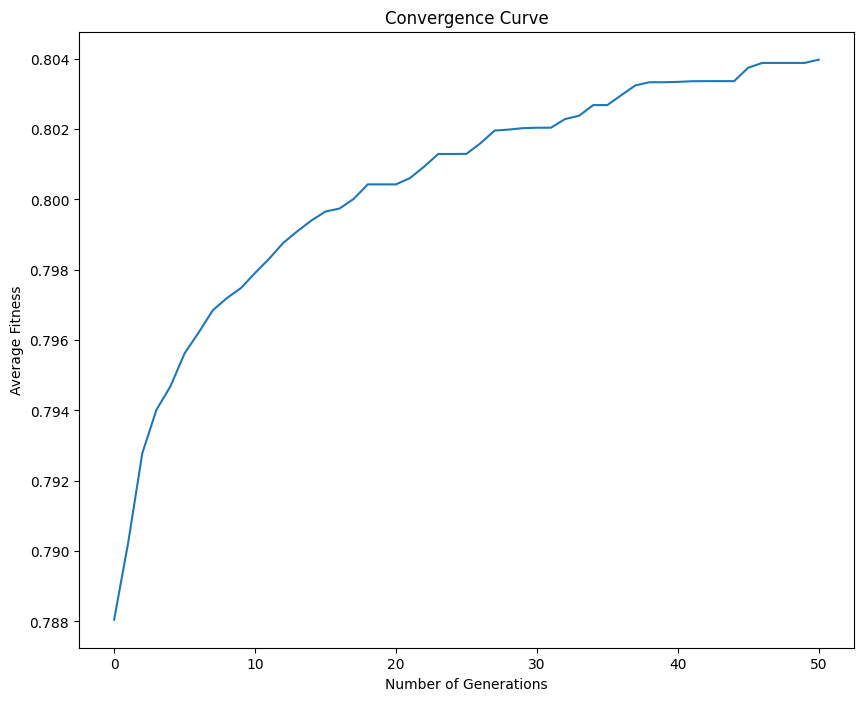


------------- Leader Agent ---------------
Fitness: 0.8093216937587798
Number of Features: 496
----------------------------------------



In [ ]:
from Py_FS.wrapper.population_based.GA import GA as FS
algo = FS(num_agents=30, max_iter=50, train_data=features, train_label=lab, save_conv_graph=True)
results = algo.run()

In [ ]:
results.solution.best_agent

array([1., 0., 1., ..., 0., 1., 1.])

In [ ]:
results.solution.best_fitness

0.8093216937587798

In [ ]:
results.solution.best_accuracy

0.8403237674760854

In [ ]:
results.solution.final_population

array([[1., 0., 1., ..., 0., 1., 1.],
       [0., 0., 0., ..., 1., 0., 1.],
       [1., 1., 1., ..., 1., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 1., 0., ..., 1., 0., 0.],
       [1., 1., 0., ..., 1., 1., 0.]])

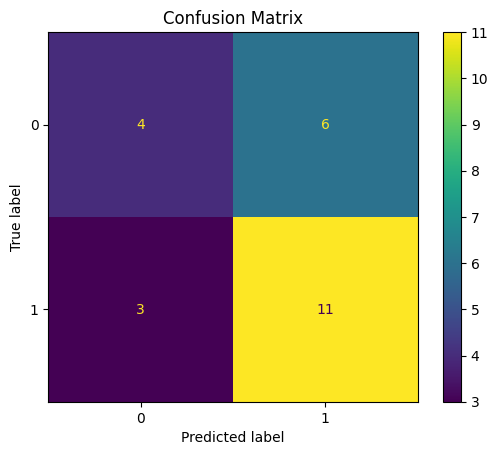

In [ ]:
from  Py_FS.evaluation.evaluate import evaluate

if(len(np.unique(test_Y))) == 2:
  # if it is binary classification, you will get a precision, recall and f1_score for each of the labels
  result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True)
else:
  # for a multi-class problem, you will get a avreaged precision, recall and f1_score
  # Options for averaging:
  # 1. macro
  # 2. weighted
  # 3. samples
  eval_result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True, averaging="weighted")

In [ ]:
result.predictions

array([0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       0, 1])

In [ ]:
result.accuracy

0.625

In [ ]:
result.precision

{0: 0.5714285714285714, 1: 0.6470588235294118}

In [ ]:
result.recall

{0: 0.4, 1: 0.7857142857142857}

In [ ]:
result.f1_score

{0: 0.47058823529411764, 1: 0.7096774193548386}


**GWO**


************    Please enter the values of the following paramters or press newline for using default values    ************

Shape of Transfer Function [s/v/u] (default=s):
Percentage of data for valdiation [0-100] (default=30): 
Weight for the classification accuracy [0-1] (default=0.9): 

*****************************************************    Thank You    ******************************************************


                          Iteration - 1


Number of agents: 30

------------- Best Agent ---------------
Fitness: 0.9430697823303458
Number of Features: 564
----------------------------------------

Greywolf 1 - Fitness: 0.9430697823303458, Number of Features: 564
Greywolf 2 - Fitness: 0.9430164319248826, Number of Features: 572
Greywolf 3 - Fitness: 0.9429630815194195, Number of Features: 580
Greywolf 4 - Fitness: 0.9427323410157917, Number of Features: 575
Greywolf 5 - Fitness: 0.9413652368758003, Number of Features: 582
Greywolf 6 - Fitness: 0.9408797481860862, Number o

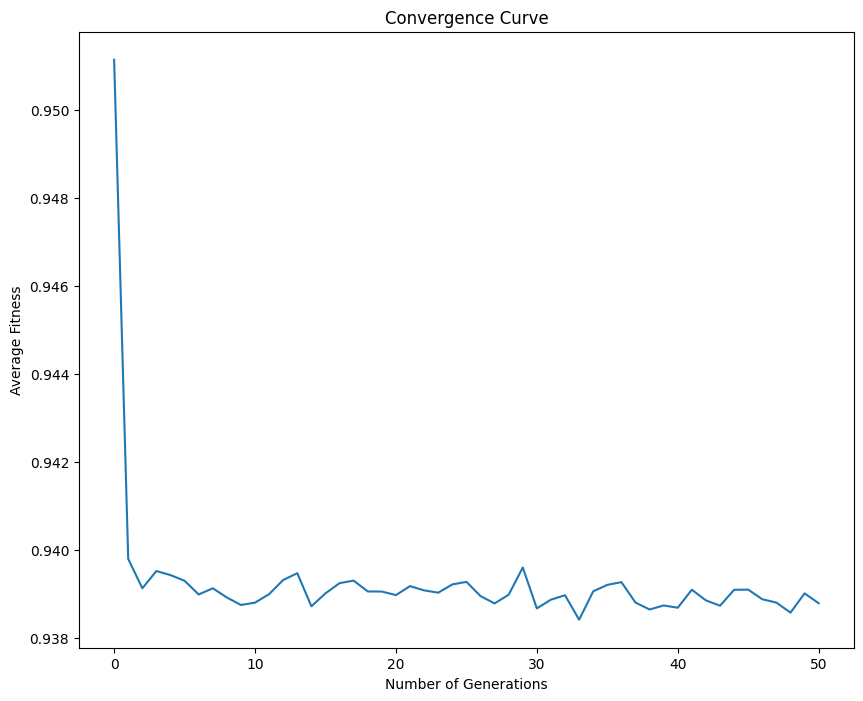


------------- Leader Agent ---------------
Fitness: 0.966637323943662
Number of Features: 606
----------------------------------------



In [ ]:
from Py_FS.wrapper.population_based.GWO import GWO as FS
algo = FS(num_agents=30, max_iter=50, train_data=features, train_label=lab, save_conv_graph=True)
results = algo.run()

In [ ]:
results.solution.best_agent

array([1., 0., 0., ..., 1., 1., 1.])

In [ ]:
results.solution.best_fitness

0.966637323943662

In [ ]:
results.solution.best_accuracy

-inf

In [ ]:
results.solution.final_population

array([[1., 1., 1., ..., 0., 1., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 1., 1.],
       ...,
       [1., 1., 0., ..., 1., 0., 1.],
       [0., 1., 1., ..., 1., 0., 1.],
       [1., 0., 0., ..., 1., 0., 1.]])

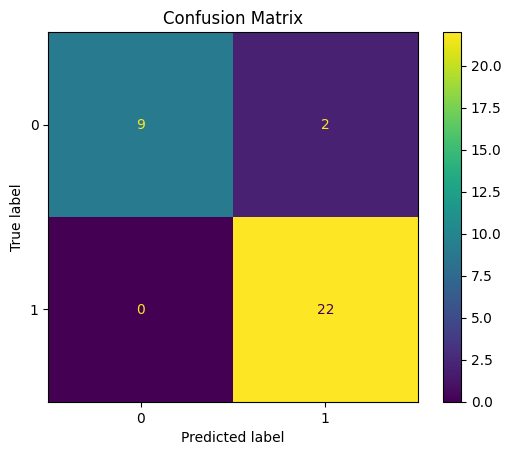

In [ ]:
if(len(np.unique(test_Y))) == 2:
  # if it is binary classification, you will get a precision, recall and f1_score for each of the labels
  result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True)
else:
  # for a multi-class problem, you will get a avreaged precision, recall and f1_score
  # Options for averaging:
  # 1. macro
  # 2. weighted
  # 3. samples
  eval_result = evaluate(train_X, test_X, train_Y, test_Y, agent=results.solution.best_agent, classifier='knn', save_conf_mat=True, averaging="weighted")

In [ ]:
result.predictions

array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0])

In [ ]:
result.accuracy

0.9090909090909091

In [ ]:
result.precision

{0: 0.9, 1: 0.9130434782608695}

In [ ]:
result.recall

{0: 0.8181818181818182, 1: 0.9545454545454546}

In [ ]:
result.f1_score

{0: 0.8571428571428572, 1: 0.9333333333333332}

In [ ]:
from google.colab import runtime
runtime.unassign()